# SatLomas: Modelo U-Net + PeruSat-1

In [3]:
from unetseg.train import TrainConfig, train
from unetseg.predict import PredictConfig, predict
import os

In [2]:
BASE_DIR = os.path.join(os.path.expanduser('~'), 'data', 'lomas', 'ps1')

## Preparación del dataset

Las escenas originales de PeruSat-1 fueron preprocesadas a una imagen RGB *pansharpened*. Luego se generaron chips (imágenes cuadradas) de 320x320 píxeles, sobre las áreas donde se anotaron con polígonos (definidos sobre el archivo vectorial AOI).

```bash
satproc_extract_chips \
    -v --size 320 --step-size 160 \
    -o $BASE_DIR/train/320_160/ \
    --bands 1 2 3 \
    --classes C U D \
    --labels $BASE_DIR/train/raw/all.shp \
    --aoi $BASE_DIR/train/raw/all.shp \
    $BASE_DIR/train/raw/CARABAYLLO_20200509_clip_rgb.tif \
    $BASE_DIR/train/raw/MANGOMARCA_20200422_clip_rgb.tif
```

In [53]:
!tree -d $BASE_DIR/train/

/home/ro/data/lomas/ps1/train/
├── 320_160
│   ├── images
│   └── masks
├── 320_320
│   └── images
└── raw

6 directories


## Entrenamiento

In [42]:
config = TrainConfig(width=320,
                     height=320,
                     n_channels=3,
                     n_classes=3,
                     apply_image_augmentation=True,
                     seed=42,
                     epochs=15,
                     batch_size=32,
                     steps_per_epoch=300,
                     early_stopping_patience=3,
                     validation_split=0.1,
                     images_path=os.path.join(BASE_DIR, 'train', '320_160'),
                     model_path=os.path.join(BASE_DIR, 'weights', 'lomas_ps1_v1.h5'))

In [43]:
from unetseg.evaluate import plot_data_generator

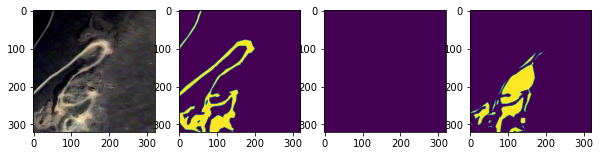

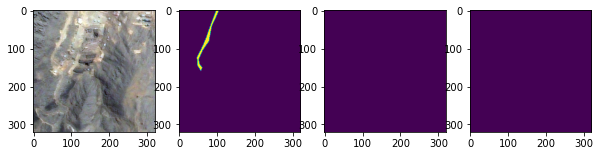

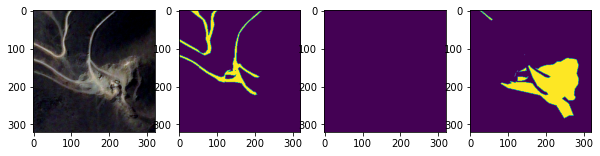

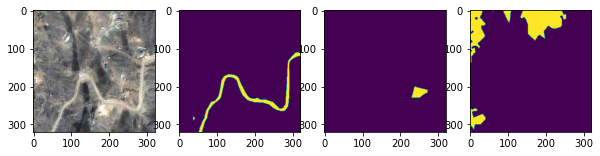

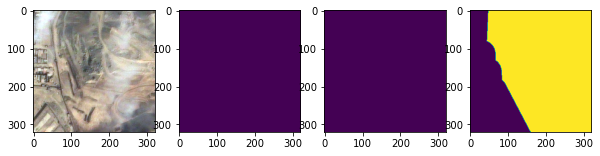

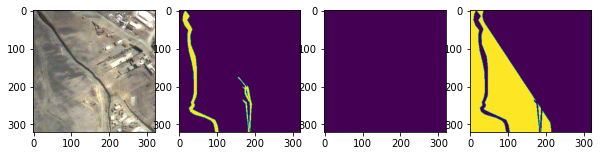

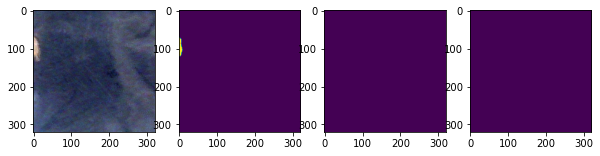

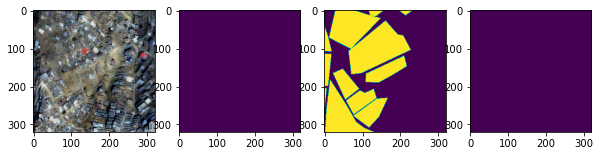

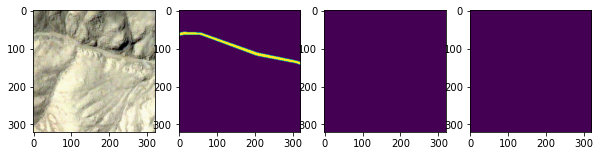

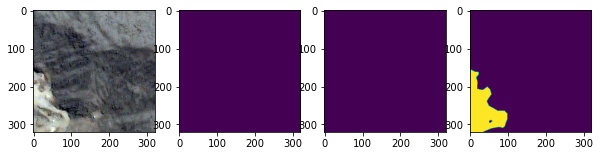

In [44]:
plot_data_generator(train_config=config, num_samples=10, fig_size=(10,6))

In [5]:
config = TrainConfig(width=320,
                     height=320,
                     n_channels=3,
                     n_classes=3,
                     apply_image_augmentation=True,
                     seed=42,
                     epochs=50,
                     batch_size=32,
                     steps_per_epoch=500,
                     early_stopping_patience=10,
                     validation_split=0.1,
                     images_path=os.path.join(BASE_DIR, 'train', '320_160'),
                     model_path=os.path.join(BASE_DIR, 'weights', 'lomas_ps1_v3.h5'))

In [6]:
results = train(config)

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            (None, 320, 320, 3)  0                                            
__________________________________________________________________________________________________
conv2d_24 (Conv2D)              (None, 320, 320, 32) 896         input_2[0][0]                    
__________________________________________________________________________________________________
conv2d_25 (Conv2D)              (None, 320, 320, 32) 9248        conv2d_24[0][0]                  
__________________________________________________________________________________________________
max_pooling2d_6 (MaxPooling2D)  (None, 160, 160, 32) 0           conv2d_25[0][0]                  
____________________________________________________________________________________________

Epoch 1/50
500/500 [==============================] - 394s 788ms/step - loss: 0.2947 - accuracy: 0.1710 - mean_iou: 0.4697 - val_loss: 0.4248 - val_accuracy: 0.1113 - val_mean_iou: 0.4720

Epoch 00001: val_loss improved from inf to 0.42481, saving model to /home/ro/data/lomas/ps1/weights/lomas_ps1_v3.h5
Epoch 2/50
500/500 [==============================] - 386s 773ms/step - loss: 0.2472 - accuracy: 0.1953 - mean_iou: 0.4731 - val_loss: 0.2956 - val_accuracy: 0.1737 - val_mean_iou: 0.4760

Epoch 00002: val_loss improved from 0.42481 to 0.29562, saving model to /home/ro/data/lomas/ps1/weights/lomas_ps1_v3.h5
Epoch 3/50
500/500 [==============================] - 391s 781ms/step - loss: 0.2338 - accuracy: 0.2427 - mean_iou: 0.4791 - val_loss: 0.2895 - val_accuracy: 0.2624 - val_mean_iou: 0.4811

Epoch 00003: val_loss improved from 0.29562 to 0.28952, saving model to /home/ro/data/lomas/ps1/weights/lomas_ps1_v3.h5
Epoch 4/50
500/500 [==============================] - 387s 775ms/step - loss:

500/500 [==============================] - 389s 779ms/step - loss: 0.0900 - accuracy: 0.4695 - mean_iou: 0.6219 - val_loss: 0.0997 - val_accuracy: 0.5167 - val_mean_iou: 0.6239

Epoch 00032: val_loss did not improve from 0.09195
Epoch 33/50
500/500 [==============================] - 390s 779ms/step - loss: 0.0826 - accuracy: 0.4726 - mean_iou: 0.6260 - val_loss: 0.0997 - val_accuracy: 0.4591 - val_mean_iou: 0.6282

Epoch 00033: val_loss did not improve from 0.09195
Epoch 34/50
500/500 [==============================] - 389s 778ms/step - loss: 0.0819 - accuracy: 0.4807 - mean_iou: 0.6303 - val_loss: 0.1268 - val_accuracy: 0.5804 - val_mean_iou: 0.6324

Epoch 00034: val_loss did not improve from 0.09195
Epoch 35/50
500/500 [==============================] - 390s 780ms/step - loss: 0.0800 - accuracy: 0.4788 - mean_iou: 0.6345 - val_loss: 0.0833 - val_accuracy: 0.5324 - val_mean_iou: 0.6364

Epoch 00035: val_loss improved from 0.09195 to 0.08333, saving model to /home/ro/data/lomas/ps1/wei

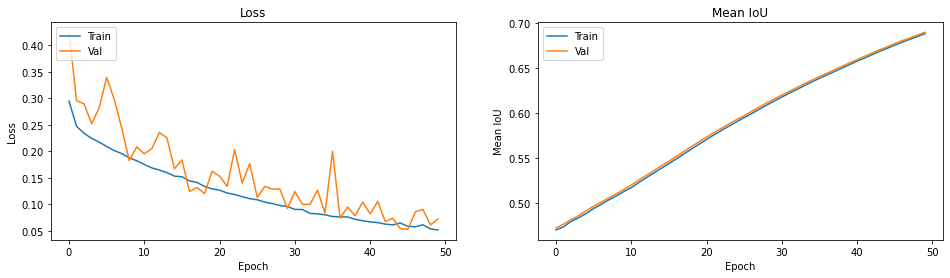

In [9]:
import matplotlib.pyplot as plt

plt.figure(figsize=(16,4))

plt.subplot(121)
plt.plot(results.history['loss'])
plt.plot(results.history['val_loss'])
plt.title('Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')

plt.subplot(122)
plt.plot(results.history['mean_iou'])
plt.plot(results.history['val_mean_iou'])
plt.title('Mean IoU')
plt.ylabel('Mean IoU')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')

plt.show()

## Predict

In [10]:
from unetseg.train import TrainConfig, train
from unetseg.predict import PredictConfig, predict
import os

In [11]:
BEST_MODEL_PATH = os.path.join(BASE_DIR, 'weights', 'lomas_ps1_v3.h5')

In [12]:
predict_config = PredictConfig(
    images_path=os.path.join(BASE_DIR, 'train', '320_160'),
    results_path=os.path.join(BASE_DIR, 'train', '320_160', 'results', 'v3'),
    batch_size=32,
    model_path=BEST_MODEL_PATH,
    height=320,
    width=320,
    n_channels=3,
    n_classes=3)

In [13]:
predict(predict_config)

Total images to predict (/home/ro/data/lomas/ps1/train/320_160/images/*.tif): 3084
After skipping existing results: 3084


100%|██████████| 97/97 [00:45<00:00,  2.13it/s]

Done!


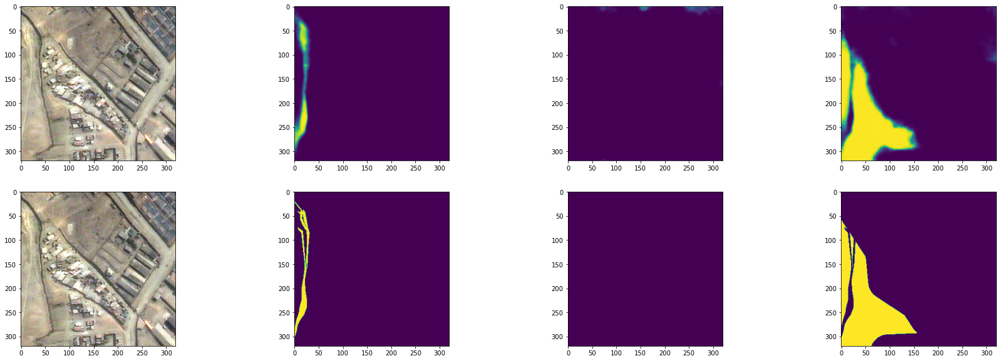

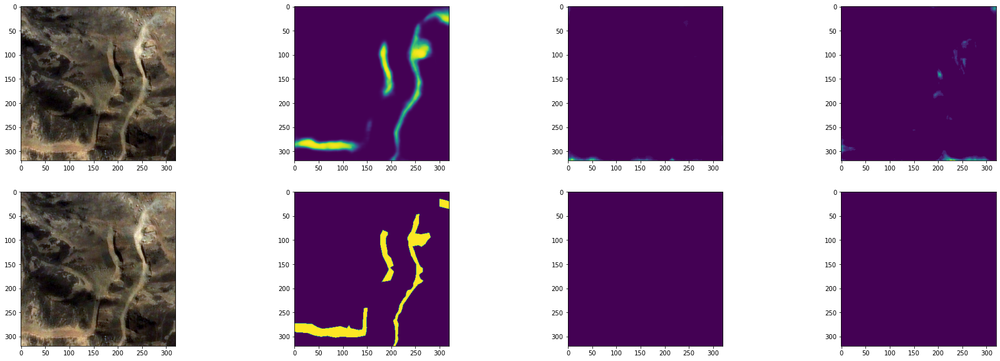

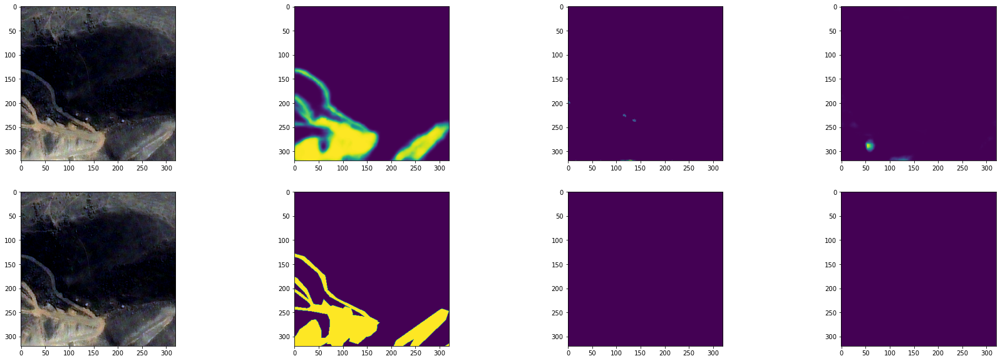

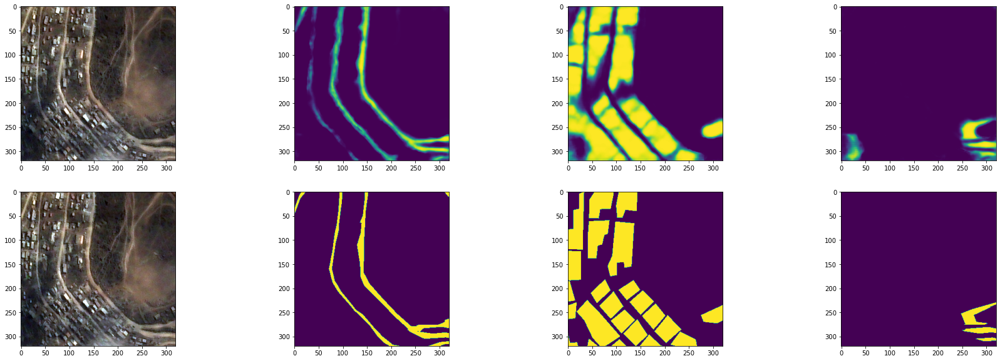

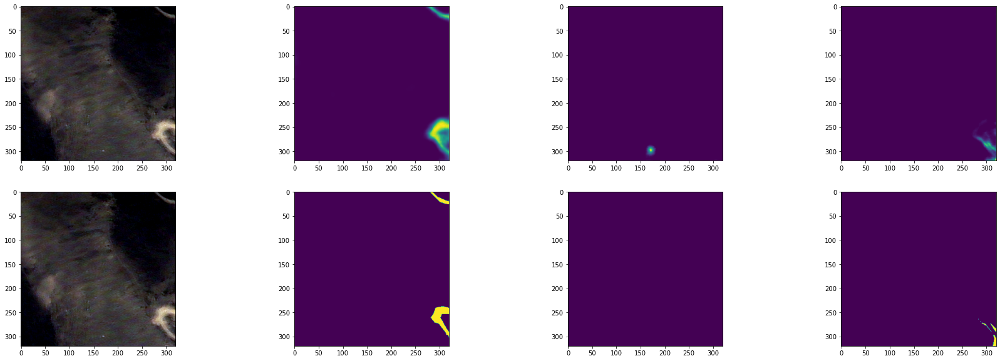

...

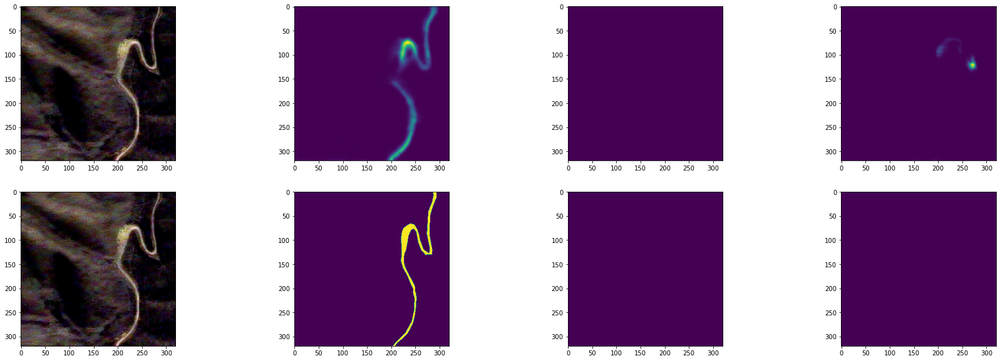

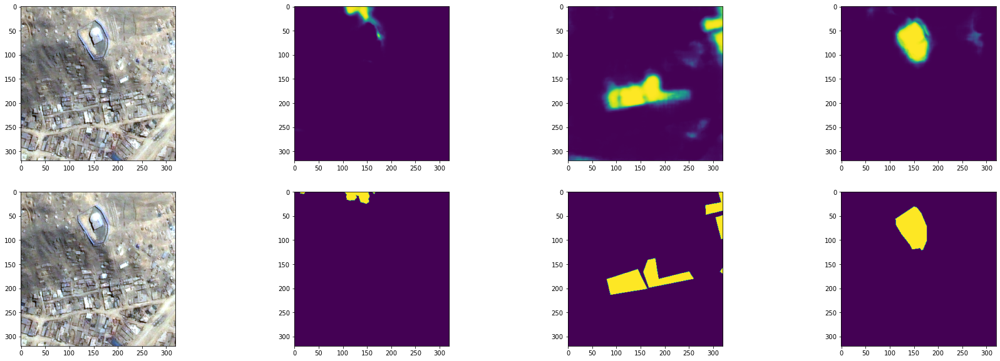

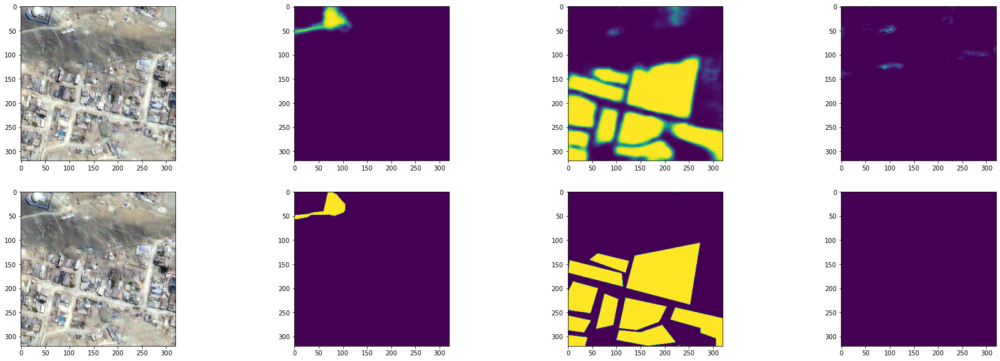

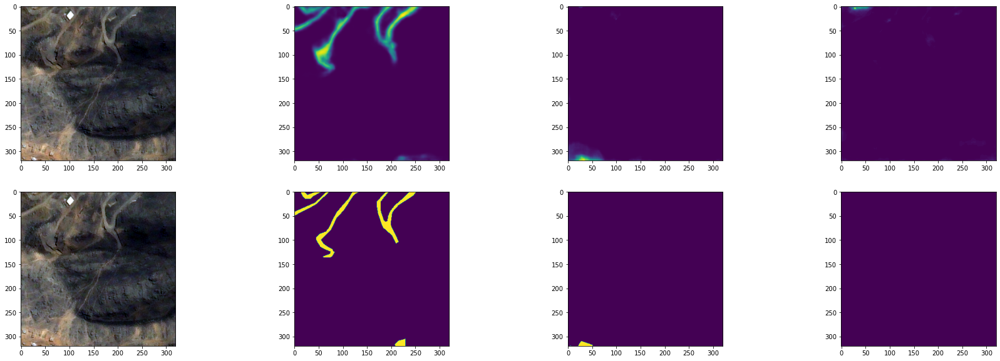

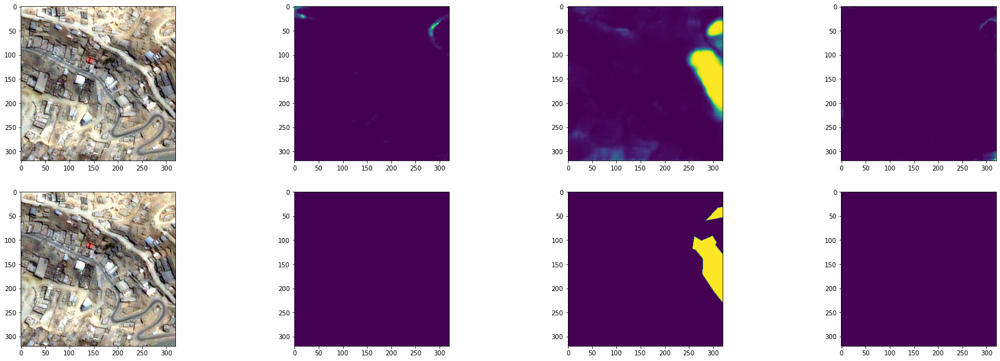

In [14]:
import tifffile as tiff
from skimage.transform import resize
from sklearn.preprocessing import minmax_scale
import matplotlib.pyplot as plt
import random
import numpy as np
from glob import glob

H = 20

images = [os.path.basename(f) for f in sorted(glob(os.path.join(predict_config.images_path, 'images', '*.tif')))]

# Sample
#images = images[:H] 
images = random.sample(images, H)

for img_file in images:
    img_ = tiff.imread(os.path.join(predict_config.images_path, 'images', img_file))[:,:,:config.n_channels]
    img_ = minmax_scale(img_.ravel(), feature_range=(0, 255)).reshape(img_.shape)
    img_ = resize(img_, (predict_config.height, predict_config.width), mode='constant', preserve_range=True).astype(np.uint8)

    # mask
    mask_v = tiff.imread(os.path.join(config.images_path, 'masks', img_file)) / 255
    mask_v = resize(mask_v, (config.height, config.width), mode='constant', preserve_range=True)

    # Prediccion
    mask_ = tiff.imread(os.path.join(predict_config.results_path, img_file)) / 255
    mask_ = resize(mask_, (predict_config.height, predict_config.width), mode='constant', preserve_range=True)   

    fig, axes = plt.subplots(nrows=2, ncols=config.n_classes + 1, figsize=(config.n_classes * 10, 10)) 
    axes[0][0].imshow(img_)
    axes[1][0].imshow(img_)
    for c in range(config.n_classes):
        axes[0][1+c].imshow(mask_[:,:,c])
        axes[1][1+c].imshow(mask_v[:,:,c])
    plt.show()
    print("=================================================================================")

## Predict (all)

```bash
satproc_extract_chips \
    -v --size 320 \
    -o $BASE_DIR/train/320_320/ \
    --bands 1 2 3 \
    --classes C U D \
    --aoi $BASE_DIR/train/raw/aoi.geojson \
    $BASE_DIR/train/raw/CARABAYLLO_20200509_clip_rgb.tif \
    $BASE_DIR/train/raw/MANGOMARCA_20200422_clip_rgb.tif
```

In [16]:
predict_config = PredictConfig(
    images_path=os.path.join(BASE_DIR, 'train', '320_320'),
    results_path=os.path.join(BASE_DIR, 'train', '320_320', 'results', 'v3'),
    batch_size=32,
    model_path=BEST_MODEL_PATH,
    height=320,
    width=320,
    n_channels=3,
    n_classes=3)
predict(predict_config)

Total images to predict (/home/ro/data/lomas/ps1/train/320_320/images/*.tif): 8952
After skipping existing results: 8952


100%|██████████| 280/280 [02:59<00:00,  1.56it/s]

Done!


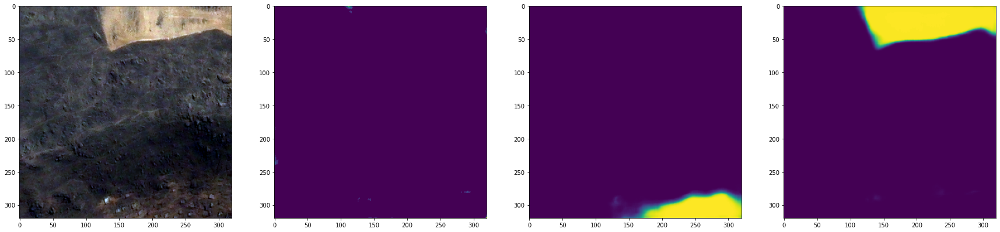

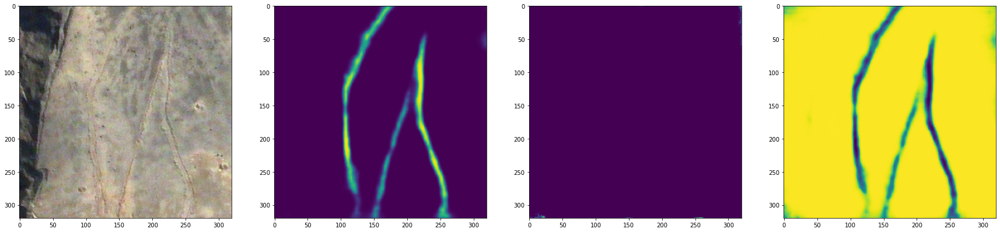

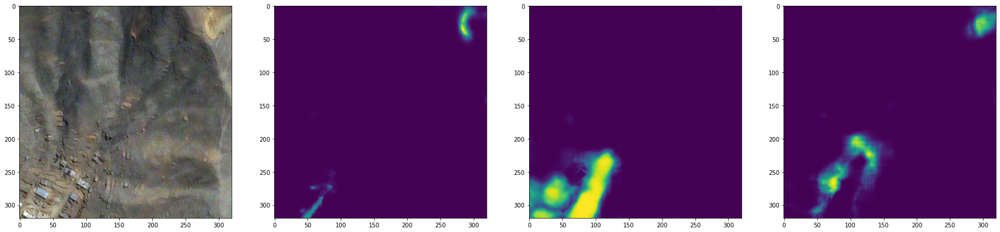

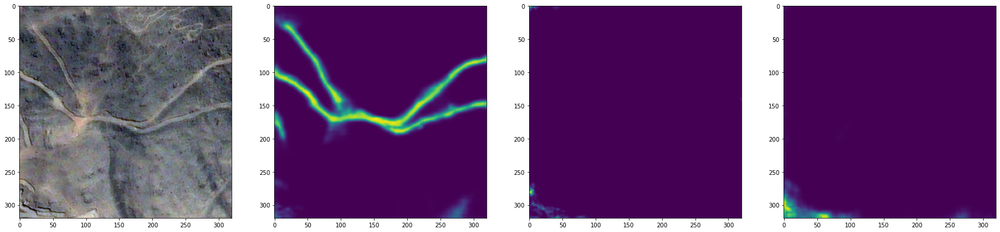

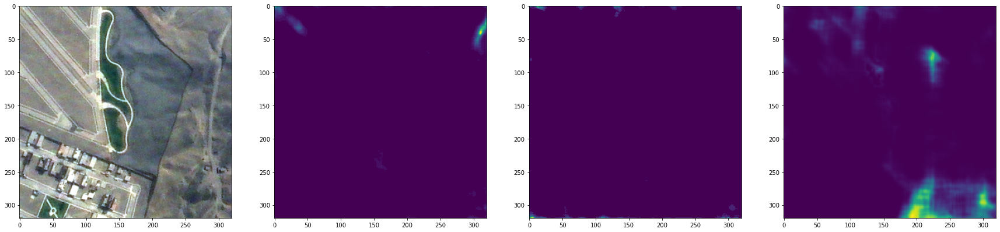

...

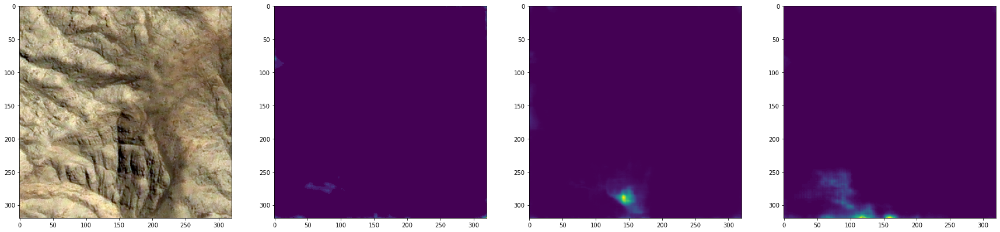

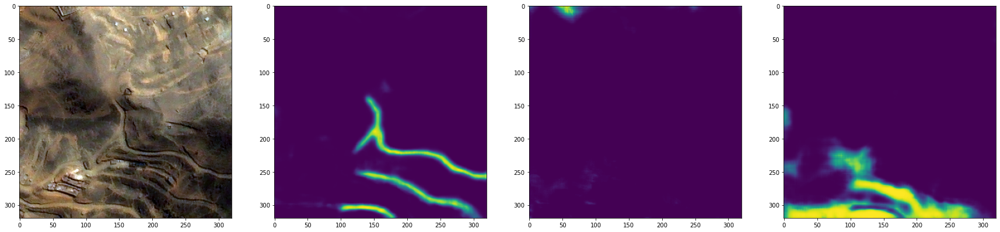

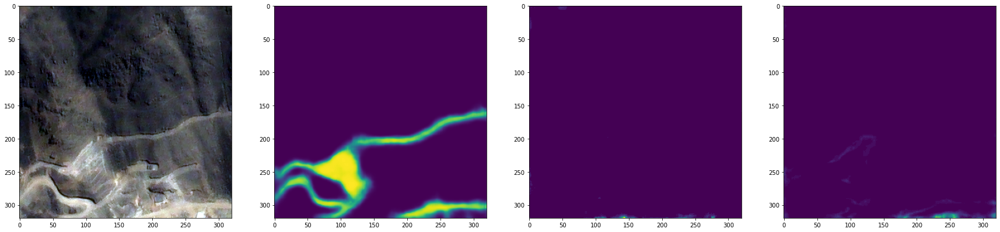

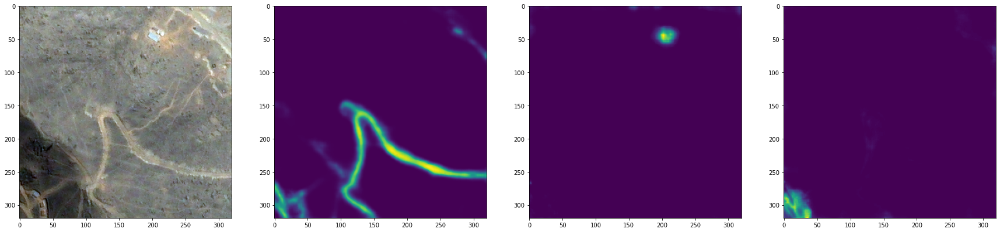

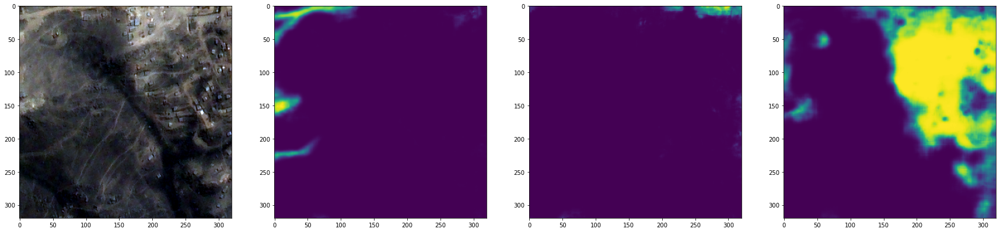

In [17]:
import tifffile as tiff
from skimage.transform import resize
from sklearn.preprocessing import minmax_scale
import matplotlib.pyplot as plt
import random
import numpy as np
from glob import glob

H = 20

images = [os.path.basename(f) for f in sorted(glob(os.path.join(predict_config.images_path, 'images', '*.tif')))]

# Sample
#images = images[:H] 
images = random.sample(images, H)

for img_file in images:
    img_ = tiff.imread(os.path.join(predict_config.images_path, 'images', img_file))[:,:,:config.n_channels]
    img_ = minmax_scale(img_.ravel(), feature_range=(0, 255)).reshape(img_.shape)
    img_ = resize(img_, (predict_config.height, predict_config.width), mode='constant', preserve_range=True).astype(np.uint8)

    # Prediccion
    mask_ = tiff.imread(os.path.join(predict_config.results_path, img_file)) / 255
    mask_ = resize(mask_, (predict_config.height, predict_config.width), mode='constant', preserve_range=True)   

    fig, axes = plt.subplots(nrows=1, ncols=config.n_classes + 1, figsize=(config.n_classes * 10, 10)) 
    axes[0].imshow(img_)
    for c in range(config.n_classes):
        axes[1+c].imshow(mask_[:,:,c])
    plt.show()